# Homecredit
銀行からの融資を受けたいが、信用が不十分なため苦労していることが多い。 また、そこに付け入る業者なども存在している。

ホームクレジットデータでは、通信会社やトランザクションの情報などを用いてクライアントの返済能力を予測する。

評価指標はROCカーブの下側面積（つまり、AUC）で測る

## Import

In [1]:
import pandas as pd # package for high-performance, easy-to-use data structures and data analysis
import numpy as np # fundamental package for scientific computing with Python
import matplotlib
import matplotlib.pyplot as plt # for plotting
import seaborn as sns # for making plots with seaborn
color = sns.color_palette()
import plotly.offline as py
py.init_notebook_mode(connected=True)
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()
# from plotly import tools
# import plotly.tools as tls
# import squarify
# from mpl_toolkits.basemap import Basemap
# from numpy import array
# from matplotlib import cm

# import cufflinks and offline mode
import cufflinks as cf
cf.go_offline()

import importlib

# from sklearn import preprocessing
# # Supress unnecessary warnings so that presentation looks clean
# import warnings
# warnings.filterwarnings("ignore")

# # Print all rows and columns
# pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)

In [2]:
import functionscript as fs
importlib.reload(fs)

<module 'functionscript' from '/Users/fushiharatakuya/データ分析/Kaggle/homecredit/study/functionscript.py'>

In [3]:
application_train = pd.read_csv('../input/application_train.csv')
POS_CASH_balance = pd.read_csv('../input/POS_CASH_balance.csv')
bureau_balance = pd.read_csv('../input/bureau_balance.csv')
previous_application = pd.read_csv('../input/previous_application.csv')
installments_payments = pd.read_csv('../input/installments_payments.csv')
credit_card_balance = pd.read_csv('../input/credit_card_balance.csv')
bureau = pd.read_csv('../input/bureau.csv')
application_test = pd.read_csv('../input/application_test.csv')

In [4]:
print('Size of application_train data', application_train.shape)
print('Size of POS_CASH_balance data', POS_CASH_balance.shape)
print('Size of bureau_balance data', bureau_balance.shape)
print('Size of previous_application data', previous_application.shape)
print('Size of installments_payments data', installments_payments.shape)
print('Size of credit_card_balance data', credit_card_balance.shape)
print('Size of bureau data', bureau.shape)

Size of application_train data (307511, 122)
Size of POS_CASH_balance data (10001358, 8)
Size of bureau_balance data (27299925, 3)
Size of previous_application data (1670214, 37)
Size of installments_payments data (13605401, 8)
Size of credit_card_balance data (3840312, 23)
Size of bureau data (1716428, 17)


# application_trainの集計

In [5]:
application_train.head(20)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.000,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.000,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.000,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.000,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.000,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
5,100008,0,Cash loans,M,N,Y,0,99000.000,490495.5,27517.5,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0
6,100009,0,Cash loans,F,Y,Y,1,171000.000,1560726.0,41301.0,...,0,0,0,0,0.0,0.0,0.0,1.0,1.0,2.0
7,100010,0,Cash loans,M,Y,Y,0,360000.000,1530000.0,42075.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
8,100011,0,Cash loans,F,N,Y,0,112500.000,1019610.0,33826.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
9,100012,0,Revolving loans,M,N,Y,0,135000.000,405000.0,20250.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
missing_application_train = fs.missing_check(application_train,5)
missing_application_train.head(20)

Number of missing columns: 67


,Total,Percent
COMMONAREA_MEDI,214865,0.698723
COMMONAREA_AVG,214865,0.698723
COMMONAREA_MODE,214865,0.698723
NONLIVINGAPARTMENTS_MODE,213514,0.694330
NONLIVINGAPARTMENTS_MEDI,213514,0.694330
NONLIVINGAPARTMENTS_AVG,213514,0.694330
FONDKAPREMONT_MODE,210295,0.683862
LIVINGAPARTMENTS_MEDI,210199,0.683550
LIVINGAPARTMENTS_MODE,210199,0.683550
LIVINGAPARTMENTS_AVG,210199,0.683550


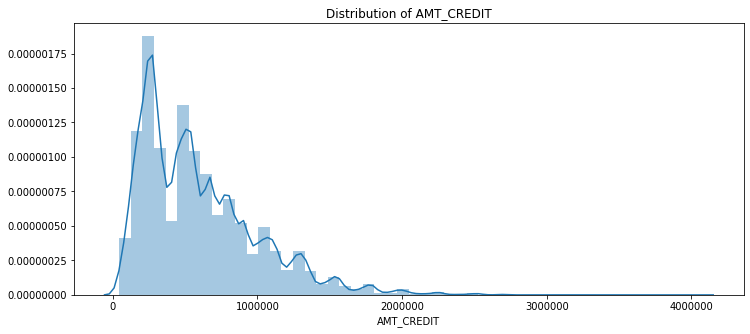

In [7]:
#ローンの金額
plt.figure(figsize=(12,5))
plt.title("Distribution of AMT_CREDIT")
ax = sns.distplot(application_train["AMT_CREDIT"])

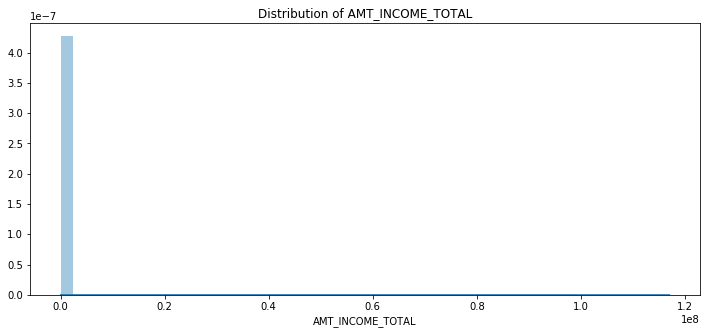

In [8]:
#クライアントの収入
plt.figure(figsize=(12,5))
plt.title("Distribution of AMT_INCOME_TOTAL")
ax = sns.distplot(application_train["AMT_INCOME_TOTAL"].dropna())

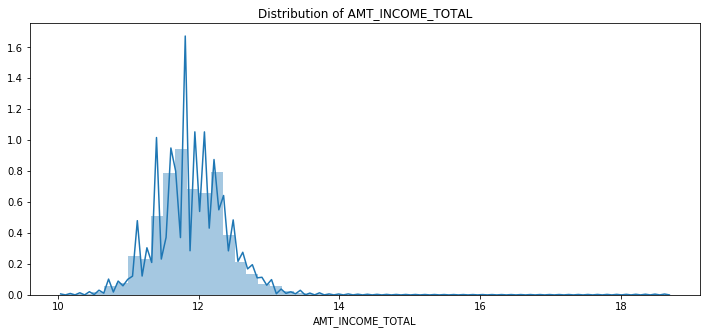

In [9]:
#クライアントの収入（Logをとった）
plt.figure(figsize=(12,5))
plt.title("Distribution of AMT_INCOME_TOTAL")
ax = sns.distplot(np.log(application_train["AMT_INCOME_TOTAL"].dropna()))

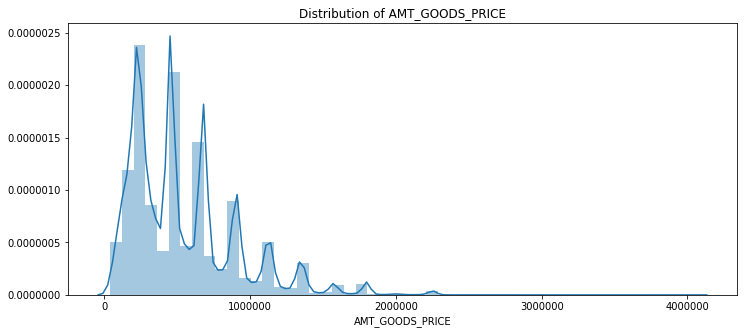

In [10]:
#ローンを適用する商品の値段
plt.figure(figsize=(12,5))
plt.title("Distribution of AMT_GOODS_PRICE")
ax = sns.distplot(application_train["AMT_GOODS_PRICE"].dropna())

In [11]:
temp= application_train['NAME_TYPE_SUITE'].value_counts()

In [12]:
trace = go.Bar(
    x = temp.index,
    y = (temp / temp.sum())*100,
)
data = [trace]

In [30]:
#ローンを組んだ際、どんな同行者がいたか
layout = go.Layout(
    title = "Who accompanied client when applying for the  application in % ",
    xaxis=dict(
        title='Name of type of the Suite',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count of Name of type of the Suite in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='schoolStateNames')

In [14]:
temp = application_train["TARGET"].value_counts()
df = pd.DataFrame({'labels': temp.index, 'values': temp.values
                  })
df.iplot(kind='pie', labels='labels',values='values', title='Loan Repayed or not')
#それぞれのラベルのデータの割合がアンバランスになっている

## カテゴリ変数と連続変数に分ける

In [308]:
numerical_feats = list(application_train.dtypes[application_train.dtypes != "object"].index)
print("Number of Numerical features: ", len(numerical_feats))

categorical_feats = list(application_train.dtypes[application_train.dtypes == "object"].index)
print("Number of Categorical features: ", len(categorical_feats))

Number of Numerical features:  106
Number of Categorical features:  16


In [309]:
#FLAG変数の数
#FLAG_feats = list(application_train.iloc[:,application_train.columns.str.startswith('FLAG_')].columns)
#len(FLAG_feats)

In [310]:
#numerical_featsの中で、変数の種類が少ないものを取り出す
add_cat_list = []
for feat in numerical_feats:
    if len(application_train[feat].value_counts().index) < 5:
        add_cat_list.append(feat)
print('numerical_featsの中で、値が５種類より少ないものは',len(add_cat_list) ,'個')

numerical_featsの中で、値が５種類より少ないものは 35 個


連続変数のうち、FLAG_と頭に来る変数はYes=1,No=0の２値変数である。
REG_やLIVE_で始まるものは住所と本籍地が一致するか（一致=1,一致しない=0）

In [311]:
add_cat_list

['TARGET',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_17',
 'FLAG_DOCUMENT_18',
 'FLAG_DOCUMENT_19',
 'FLAG_DOCUMENT_20',
 'FLAG_DOCUMENT_21']

In [312]:
#元のカテゴリカル変数リストに追加するカテゴリカル変数の数
add_categorical_feats = list(set(add_cat_list).difference(categorical_feats)) 
len(add_categorical_feats)

35

In [313]:
# 連続変数から追加するカテゴリカル変数を削除
#カテゴリカル変数に新たな変数を追加
for feat in add_categorical_feats:
    numerical_feats.remove(feat)
    categorical_feats.append(feat)
    
print("Number of Numerical features: ", len(numerical_feats))
print("Number of Categorical features: ", len(categorical_feats))

Number of Numerical features:  71
Number of Categorical features:  51


In [302]:
importlib.reload(fs)

<module 'functionscript' from '/Users/fushiharatakuya/データ分析/Kaggle/homecredit/study/functionscript.py'>

### カテゴリカル変数の可視化

In [209]:
#train_object_columns = application_train.select_dtypes('object').columns

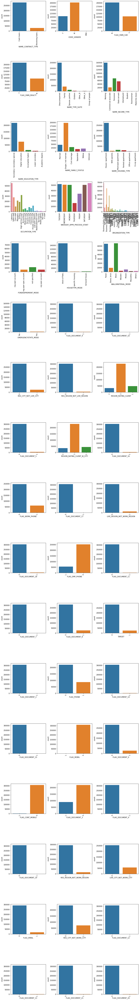

In [303]:
fs.object_countplot(application_train,add_categorical_feats,3,label_vertical=True)

In [117]:

#temp = application_train["NAME_INCOME_TYPE"].value_counts()
#df = pd.DataFrame({'labels': temp.index,
 #                  'values': temp.values
 #                 })
#df.iplot(kind='pie',labels='labels',values='values', title='Income sources of Applicant\'s', hole = 0.5)

In [118]:
#Marriedは結婚しているかつ同居か？
#temp = application_train["NAME_FAMILY_STATUS"].value_counts()
#df = pd.DataFrame({'labels': temp.index,
 #                  'values': temp.values
  #                })
#df.iplot(kind='pie',labels='labels',values='values', title='Family Status of Applicant\'s', hole = 0.5)

In [119]:
#職業
#temp = application_train["OCCUPATION_TYPE"].value_counts()
#temp.iplot(kind='bar', xTitle = 'Occupation', yTitle = "Count", title = 'Occupation of Applicant\'s who applied for loan', color = 'green')

In [120]:
#temp = application_train["NAME_EDUCATION_TYPE"].value_counts()
#df = pd.DataFrame({'labels': temp.index,
  #                 'values': temp.values
    #              })
#df.iplot(kind='pie',labels='labels',values='values', title='Education of Applicant\'s', hole = 0.5)

In [121]:
#どんな家に住んでいるか
# House 持ち家
#with parents 親と同居
#Municipal apartment 市営マンション
#Rented apartment 賃貸マンション
#office apartment 社宅？
# Co-op apartment　生協マンション
#temp = application_train["NAME_HOUSING_TYPE"].value_counts()
#df = pd.DataFrame({'labels': temp.index,
  #                 'values': temp.values
    #              })
#df.iplot(kind='pie',labels='labels',values='values', title='Type of House', hole = 0.5)

In [122]:
#ローン組んだ人が所属する組織のタイプ
#temp = application_train["ORGANIZATION_TYPE"].value_counts()
#temp.iplot(kind='bar', xTitle = 'Organization Name', yTitle = "Count", title = 'Types of Organizations who applied for loan ', color = 'red')

## カテゴリ変数とターゲットの集計

### クライアントがどのように収入を得ているかごとにターゲットの集計
pensionerは年金受給者
commercial associate 商業関係

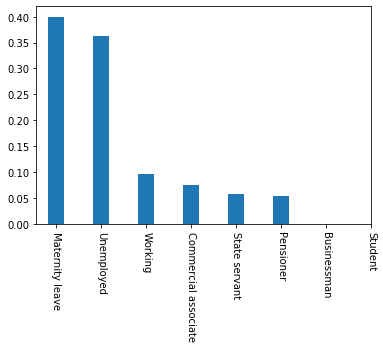

,tar_per,count,tar1_count
Maternity leave,0.400000,5,2.0
Unemployed,0.363636,22,8.0
Working,0.095885,158774,15224.0
Commercial associate,0.074843,71617,5360.0
State servant,0.057550,21703,1249.0
Pensioner,0.053864,55362,2982.0
Businessman,NaN,10,NaN
Student,NaN,18,NaN


In [115]:
fs.iplt_countplot('NAME_INCOME_TYPE','TARGET',application_train)
temp = fs.object_label('NAME_INCOME_TYPE','TARGET',application_train)
temp.head(10)

グラフからは差がありそうに見えるが、上位２つはサンプル数が少ないため有意差があるかはわからない

In [116]:
#変数とターゲットのラベルごとの集計
#g = sns.countplot(x='NAME_FAMILY_STATUS',hue='TARGET',data=application_train)
#a = application_train['NAME_FAMILY_STATUS'].value_counts().index
#g.set_xticklabels(g.get_xticklabels(),rotation=90)
#g.set_xticklabels(a,rotation=90)

### 家族状況ごとのターゲットの集計

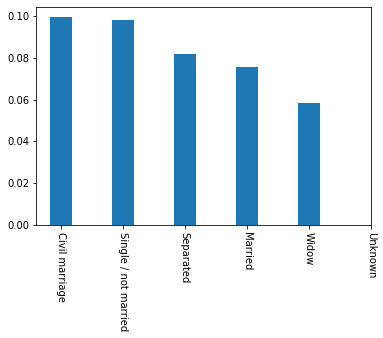

,tar_per,count,tar1_count
Civil marriage,0.099446,29775,2961.0
Single / not married,0.098077,45444,4457.0
Separated,0.081942,19770,1620.0
Married,0.075599,196432,14850.0
Widow,0.058242,16088,937.0


In [109]:
fs.iplt_countplot('NAME_FAMILY_STATUS','TARGET',application_train)
temp = fs.object_label("NAME_FAMILY_STATUS",'TARGET',application_train)
temp.head()

多少カテゴリ間でのラベル1の割合に差がありそう？

### 職業ごとにターゲットの数を集計

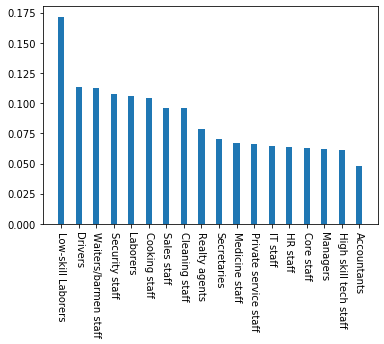

,tar_per,count,tar1_count
Low-skill Laborers,0.171524,2093,359
Drivers,0.113261,18603,2107
Waiters/barmen staff,0.112760,1348,152
Security staff,0.107424,6721,722
Laborers,0.105788,55186,5838


In [110]:
fs.iplt_countplot('OCCUPATION_TYPE','TARGET',application_train)
temp = fs.object_label('OCCUPATION_TYPE','TARGET',application_train)
temp.head()

明らかにLow-skill-Laborersだけ飛び抜けている

### 教育の度合いごとにターゲットの集計

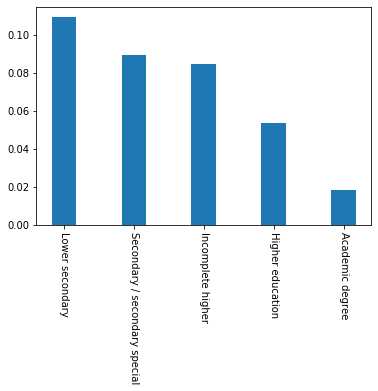

,tar_per,count,tar1_count
Lower secondary,0.109277,3816,417
Secondary / secondary special,0.089399,218391,19524
Incomplete higher,0.084850,10277,872
Higher education,0.053551,74863,4009
Academic degree,0.018293,164,3


In [111]:
fs.iplt_countplot('NAME_EDUCATION_TYPE','TARGET',application_train)
temp = fs.object_label('NAME_EDUCATION_TYPE','TARGET',application_train)
temp.head()

有意差はありそう

### どんな家に住んでいるかごとでターゲットの集計

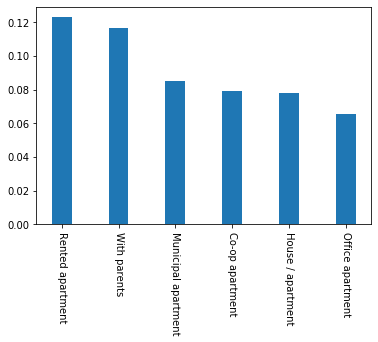

,tar_per,count,tar1_count
Rented apartment,0.123131,4881,601
With parents,0.116981,14840,1736
Municipal apartment,0.085397,11183,955
Co-op apartment,0.079323,1122,89
House / apartment,0.077957,272868,21272


In [112]:
fs.iplt_countplot('NAME_HOUSING_TYPE','TARGET',application_train)
temp = fs.object_label('NAME_HOUSING_TYPE','TARGET',application_train)
temp.head()
# House 持ち家
#with parents 親と同居
#Municipal apartment 市営マンション
#Rented apartment 賃貸マンション
#office apartment 社宅？
# Co-op apartment　生協マンション

多少は差がありそうだが割合が多いカテゴリはサンプル数が少なそう

### 業種、業界ごとでターゲットの集計

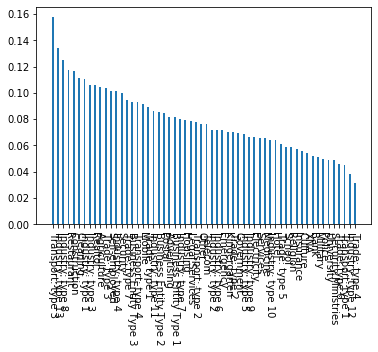

,tar_per,count,tar1_count
Transport: type 3,0.157540,1187,187
Industry: type 13,0.134328,67,9
Industry: type 8,0.125000,24,3
Restaurant,0.117062,1811,212
Construction,0.116798,6721,785


In [113]:
fs.iplt_countplot('ORGANIZATION_TYPE','TARGET',application_train)
temp = fs.object_label('ORGANIZATION_TYPE','TARGET',application_train)
temp.head()
#mappingが必要、4つ５つくらい
#labelencodingはしない方がいい

有意差はあるように見える

### ローンを組む際の同行者ごとでターゲットの集計

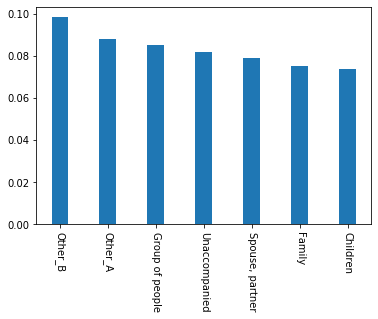

,tar_per,count,tar1_count
Other_B,0.098305,1770,174
Other_A,0.087760,866,76
Group of people,0.084871,271,23
Unaccompanied,0.081830,248526,20337
"Spouse, partner",0.078716,11370,895


In [108]:
fs.iplt_countplot('NAME_TYPE_SUITE','TARGET',application_train)
temp = fs.object_label('NAME_TYPE_SUITE','TARGET',application_train)
temp.head()
#3つ4つくらいにする

カテゴリ間のTARGETの割合に有意な差はなさそう

In [107]:
importlib.reload(fs)

<module 'functionscript' from '/Users/fushiharatakuya/データ分析/Kaggle/homecredit/study/functionscript.py'>

## 連続変数の可視化

変数はすでに分けてある

In [314]:
print("Number of Numerical features: ", len(numerical_feats))

Number of Numerical features:  71


In [132]:
application_train['EXT_SOURCE_3']

0         0.139376
1              NaN
2         0.729567
3              NaN
4              NaN
            ...   
307506         NaN
307507         NaN
307508    0.218859
307509    0.661024
307510    0.113922
Name: EXT_SOURCE_3, Length: 307511, dtype: float64

The correlation between EXT_SOURCE_3 and the TARGET is -0.1789
Median value for loan that was not repaid = 0.3791
Median value for loan that was repaid =     0.5460


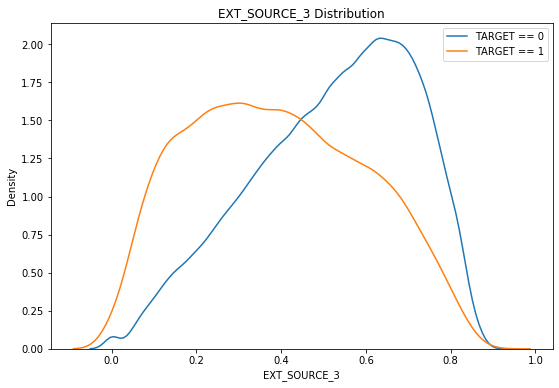

In [136]:
kde_target('EXT_SOURCE_3',application_train)

値の種類が少ないとKDEプロットができないので、値の種類が15以上の変数のみkdeplotをする

The correlation between SK_ID_CURR and the TARGET is -0.0021
Median value for loan that was not repaid = 276291.0000
Median value for loan that was repaid =     278362.5000
The correlation between AMT_INCOME_TOTAL and the TARGET is -0.0040
Median value for loan that was not repaid = 135000.0000
Median value for loan that was repaid =     148500.0000
The correlation between AMT_CREDIT and the TARGET is -0.0304
Median value for loan that was not repaid = 497520.0000
Median value for loan that was repaid =     517788.0000
The correlation between AMT_ANNUITY and the TARGET is -0.0128
Median value for loan that was not repaid = 25263.0000
Median value for loan that was repaid =     24876.0000
The correlation between AMT_GOODS_PRICE and the TARGET is -0.0396
Median value for loan that was not repaid = 450000.0000
Median value for loan that was repaid =     450000.0000
The correlation between REGION_POPULATION_RELATIVE and the TARGET is -0.0372
Median value for loan that was not repaid = 0.01

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figu

The correlation between ELEVATORS_AVG and the TARGET is -0.0342
Median value for loan that was not repaid = 0.0000
Median value for loan that was repaid =     0.0000
The correlation between ENTRANCES_AVG and the TARGET is -0.0192
Median value for loan that was not repaid = 0.1379
Median value for loan that was repaid =     0.1379
The correlation between FLOORSMAX_AVG and the TARGET is -0.0440
Median value for loan that was not repaid = 0.1667
Median value for loan that was repaid =     0.1667


/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figu

The correlation between FLOORSMIN_AVG and the TARGET is -0.0336
Median value for loan that was not repaid = 0.2083
Median value for loan that was repaid =     0.2083
The correlation between LANDAREA_AVG and the TARGET is -0.0109
Median value for loan that was not repaid = 0.0449
Median value for loan that was repaid =     0.0484
The correlation between LIVINGAPARTMENTS_AVG and the TARGET is -0.0250
Median value for loan that was not repaid = 0.0672
Median value for loan that was repaid =     0.0756


/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



The correlation between LIVINGAREA_AVG and the TARGET is -0.0330
Median value for loan that was not repaid = 0.0667
Median value for loan that was repaid =     0.0752
The correlation between NONLIVINGAPARTMENTS_AVG and the TARGET is -0.0032
Median value for loan that was not repaid = 0.0000
Median value for loan that was repaid =     0.0000
The correlation between NONLIVINGAREA_AVG and the TARGET is -0.0136
Median value for loan that was not repaid = 0.0028
Median value for loan that was repaid =     0.0036


/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figu

The correlation between APARTMENTS_MODE and the TARGET is -0.0273
Median value for loan that was not repaid = 0.0809
Median value for loan that was repaid =     0.0840
The correlation between BASEMENTAREA_MODE and the TARGET is -0.0200
Median value for loan that was not repaid = 0.0716
Median value for loan that was repaid =     0.0748
The correlation between YEARS_BEGINEXPLUATATION_MODE and the TARGET is -0.0090
Median value for loan that was not repaid = 0.9806
Median value for loan that was repaid =     0.9816


/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figu

The correlation between YEARS_BUILD_MODE and the TARGET is -0.0221
Median value for loan that was not repaid = 0.7550
Median value for loan that was repaid =     0.7648
The correlation between COMMONAREA_MODE and the TARGET is -0.0163
Median value for loan that was not repaid = 0.0171
Median value for loan that was repaid =     0.0192


/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



The correlation between ELEVATORS_MODE and the TARGET is -0.0321
Median value for loan that was not repaid = 0.0000
Median value for loan that was repaid =     0.0000
The correlation between ENTRANCES_MODE and the TARGET is -0.0174
Median value for loan that was not repaid = 0.1379
Median value for loan that was repaid =     0.1379
The correlation between FLOORSMAX_MODE and the TARGET is -0.0432
Median value for loan that was not repaid = 0.1667
Median value for loan that was repaid =     0.1667


/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figu

The correlation between FLOORSMIN_MODE and the TARGET is -0.0327
Median value for loan that was not repaid = 0.2083
Median value for loan that was repaid =     0.2083
The correlation between LANDAREA_MODE and the TARGET is -0.0102
Median value for loan that was not repaid = 0.0428
Median value for loan that was repaid =     0.0461
The correlation between LIVINGAPARTMENTS_MODE and the TARGET is -0.0234
Median value for loan that was not repaid = 0.0735
Median value for loan that was repaid =     0.0771


/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figu

The correlation between LIVINGAREA_MODE and the TARGET is -0.0307
Median value for loan that was not repaid = 0.0668
Median value for loan that was repaid =     0.0734
The correlation between NONLIVINGAPARTMENTS_MODE and the TARGET is -0.0016
Median value for loan that was not repaid = 0.0000
Median value for loan that was repaid =     0.0000


/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



The correlation between NONLIVINGAREA_MODE and the TARGET is -0.0127
Median value for loan that was not repaid = 0.0000
Median value for loan that was repaid =     0.0011
The correlation between APARTMENTS_MEDI and the TARGET is -0.0292
Median value for loan that was not repaid = 0.0833
Median value for loan that was repaid =     0.0874
The correlation between BASEMENTAREA_MEDI and the TARGET is -0.0221
Median value for loan that was not repaid = 0.0718
Median value for loan that was repaid =     0.0761


/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figu

The correlation between YEARS_BEGINEXPLUATATION_MEDI and the TARGET is -0.0100
Median value for loan that was not repaid = 0.9811
Median value for loan that was repaid =     0.9821
The correlation between YEARS_BUILD_MEDI and the TARGET is -0.0223
Median value for loan that was not repaid = 0.7518
Median value for loan that was repaid =     0.7585
The correlation between COMMONAREA_MEDI and the TARGET is -0.0186
Median value for loan that was not repaid = 0.0183
Median value for loan that was repaid =     0.0210


/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figu

The correlation between ELEVATORS_MEDI and the TARGET is -0.0339
Median value for loan that was not repaid = 0.0000
Median value for loan that was repaid =     0.0000
The correlation between ENTRANCES_MEDI and the TARGET is -0.0190
Median value for loan that was not repaid = 0.1379
Median value for loan that was repaid =     0.1379
The correlation between FLOORSMAX_MEDI and the TARGET is -0.0438
Median value for loan that was not repaid = 0.1667
Median value for loan that was repaid =     0.1667


/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figu

The correlation between FLOORSMIN_MEDI and the TARGET is -0.0334
Median value for loan that was not repaid = 0.2083
Median value for loan that was repaid =     0.2083
The correlation between LANDAREA_MEDI and the TARGET is -0.0113
Median value for loan that was not repaid = 0.0454
Median value for loan that was repaid =     0.0489
The correlation between LIVINGAPARTMENTS_MEDI and the TARGET is -0.0246
Median value for loan that was not repaid = 0.0684
Median value for loan that was repaid =     0.0770


/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figu

The correlation between LIVINGAREA_MEDI and the TARGET is -0.0327
Median value for loan that was not repaid = 0.0677
Median value for loan that was repaid =     0.0758
The correlation between NONLIVINGAPARTMENTS_MEDI and the TARGET is -0.0028
Median value for loan that was not repaid = 0.0000
Median value for loan that was repaid =     0.0000


/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



The correlation between NONLIVINGAREA_MEDI and the TARGET is -0.0133
Median value for loan that was not repaid = 0.0023
Median value for loan that was repaid =     0.0031
The correlation between TOTALAREA_MODE and the TARGET is -0.0326
Median value for loan that was not repaid = 0.0617
Median value for loan that was repaid =     0.0691


/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



The correlation between OBS_30_CNT_SOCIAL_CIRCLE and the TARGET is 0.0091
Median value for loan that was not repaid = 0.0000
Median value for loan that was repaid =     0.0000
The correlation between OBS_60_CNT_SOCIAL_CIRCLE and the TARGET is 0.0090
Median value for loan that was not repaid = 0.0000
Median value for loan that was repaid =     0.0000


/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



The correlation between DAYS_LAST_PHONE_CHANGE and the TARGET is 0.0552
Median value for loan that was not repaid = -594.0000
Median value for loan that was repaid =     -776.0000


/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



RuntimeError: Selected KDE bandwidth is 0. Cannot estiamte density.

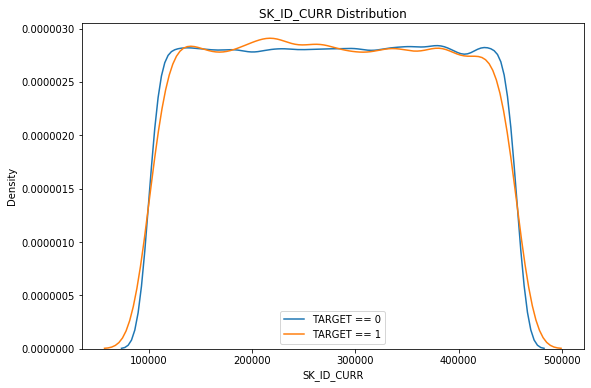

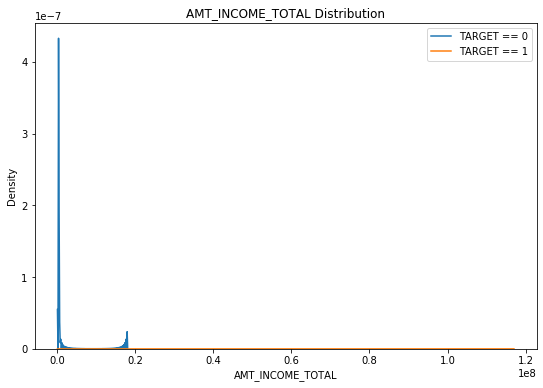

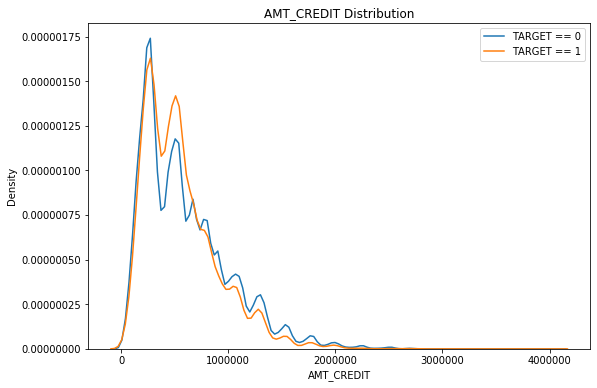

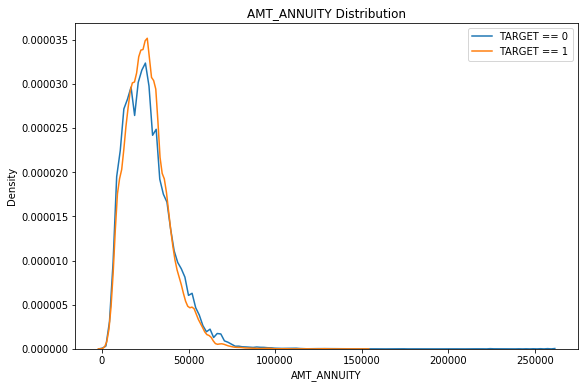

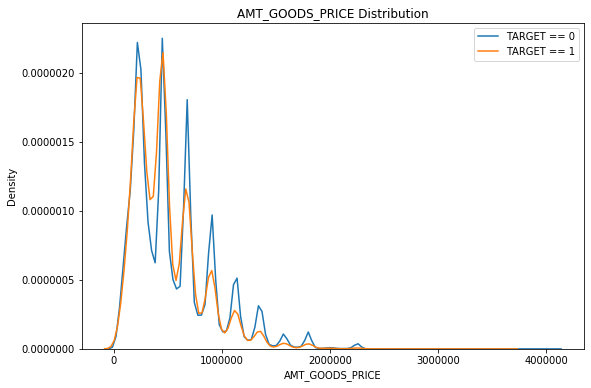

...

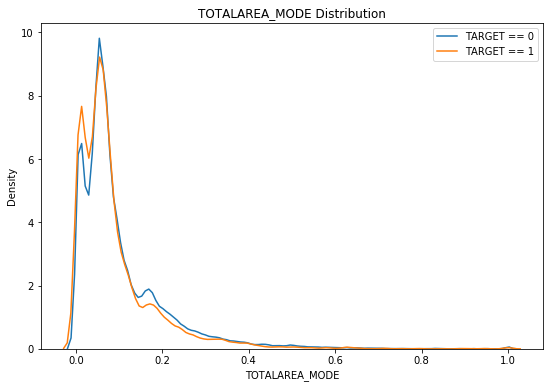

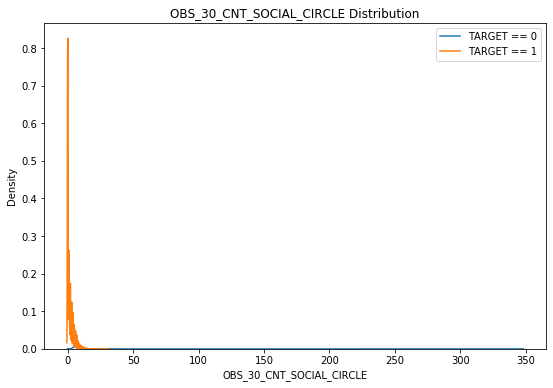

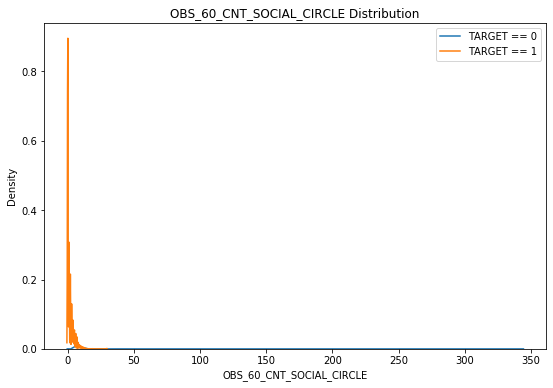

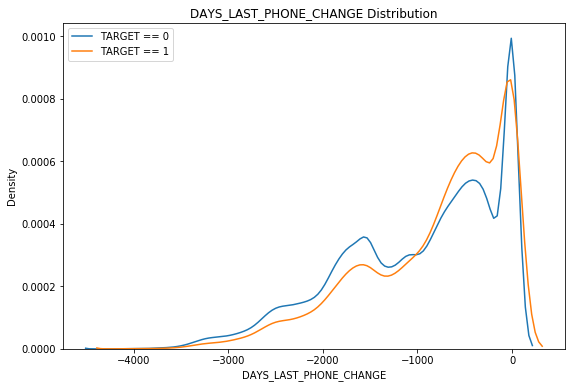

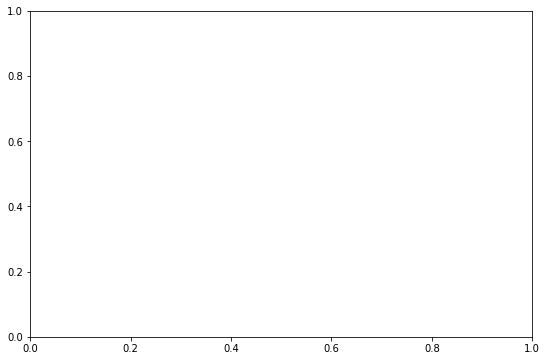

In [269]:

no_kde_feats = []
for feat in list(numerical_feats):
    if len(application_train[feat].value_counts().index) > 15:
        kde_target(feat, application_train)
    else:
        no_kde_feats.append(feat)

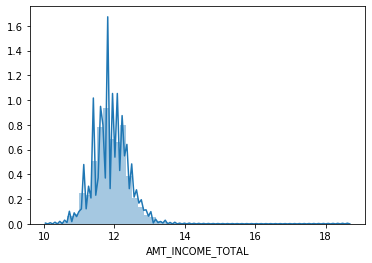

In [318]:
sns.distplot(np.log(application_train['AMT_INCOME_TOTAL']))

The correlation between AMT_INCOME_TOTAL and the TARGET is -0.0040
Median value for loan that was not repaid = 135000.0000
Median value for loan that was repaid =     148500.0000


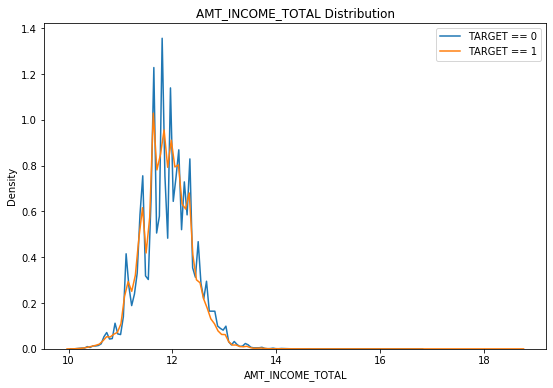

In [319]:
log_kde_target('AMT_INCOME_TOTAL',application_train)

In [ ]:
#年収
#このcsvだけで、モデルを作ってみる
#labelencodingをする
#特徴量は他のノートブックから引用する
#pivot_table
#学歴低いのに
#細かく分ける。それの平均をとる。
#仮説を元に2変数で見てみる
#stratify kfold、そうか抽出

In [270]:
no_kde_feats

['TARGET',
 'CNT_CHILDREN',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK']

In [261]:
cat_list = []
for feat in numerical_feats:
    if len(application_train[feat].value_counts().index) < 15:
        cat_list.append(feat)
        print(len(application_train[feat].value_counts().index))
len(cat_list) 

2
3
3
2
2
2
2
2
2
10
9
5
9
9
11


15

In [339]:
pivot = application_train.pivot_table(index='NAME_EDUCATION_TYPE',columns='OCCUPATION_TYPE' ,values='TARGET',aggfunc=[np.mean, len])
pivot

mean                               \
OCCUPATION_TYPE               Accountants Cleaning staff Cooking staff   
NAME_EDUCATION_TYPE                                                      
Academic degree                  0.125000       0.000000      0.000000   
Higher education                 0.038806       0.084000      0.088993   
Incomplete higher                0.056180       0.102041      0.093220   
Lower secondary                  0.166667       0.138889      0.171875   
Secondary / secondary special    0.062077       0.095664      0.105135   

                                                              \
OCCUPATION_TYPE               Core staff   Drivers  HR staff   
NAME_EDUCATION_TYPE                                            
Academic degree                 0.000000  0.000000       NaN   
Higher education                0.045670  0.083415  0.044818   
Incomplete higher               0.083902  0.103870  0.083333   
Lower secondary                 0.105691  0.128514       NaN   
Secondary / secondary special   0.078621  0.117219  0.100000   

                                                                         \
OCCUPATION_TYPE               High skill tech staff  IT staff  Laborers   
NAME_EDUCATION_TYPE                                                       
Academic degree                            0.000000       NaN  0.000000   
Higher education                           0.047261  0.049853  0.076011   
Incomplete higher                          0.070085  0.038462  0.086326   
Lower secondary                            0.129032  0.000000  0.160274   
Secondary / secondary special              0.071405  0.113636  0.109848   

                                                  ...      len  \
OCCUPATION_TYPE               Low-skill Laborers  ... Laborers   
NAME_EDUCATION_TYPE                               ...            
Academic degree                         0.000000  ...      9.0   
Higher education                        0.098765  ...   6578.0   
Incomplete higher                       0.200000  ...   1587.0   
Lower secondary                         0.173913  ...    730.0   
Secondary / secondary special           0.174166  ...  46282.0   

                                                                          \
OCCUPATION_TYPE               Low-skill Laborers Managers Medicine staff   
NAME_EDUCATION_TYPE                                                        
Academic degree                              1.0     37.0            NaN   
Higher education                            81.0  11499.0          999.0   
Incomplete higher                           30.0    931.0          146.0   
Lower secondary                             92.0     57.0           77.0   
Secondary / secondary special             1889.0   8847.0         7315.0   

                                                                               \
OCCUPATION_TYPE               Private service staff Realty agents Sales staff   
NAME_EDUCATION_TYPE                                                             
Academic degree                                 2.0           1.0         9.0   
Higher education                              519.0         227.0      5562.0   
Incomplete higher                             114.0          47.0      1468.0   
Lower secondary                                11.0           2.0       228.0   
Secondary / secondary special                2006.0         474.0     24835.0   

                                                                               
OCCUPATION_TYPE               Secretaries Security staff Waiters/barmen staff  
NAME_EDUCATION_TYPE                                                            
Academic degree                       NaN            4.0                  NaN  
Higher education                    481.0          821.0                179.0  
Incomplete higher                    96.0          156.0                 94.0  
Lower secondary                       4.0           97.0       

In [335]:
pivot.T.sort_values('Lower secondary',ascending=False)

NAME_EDUCATION_TYPE,Academic degree,Higher education,Incomplete higher,Lower secondary,Secondary / secondary special
OCCUPATION_TYPE,,,,,
Low-skill Laborers,0.000000,0.098765,0.200000,0.173913,0.174166
Cooking staff,0.000000,0.088993,0.093220,0.171875,0.105135
Accountants,0.125000,0.038806,0.056180,0.166667,0.062077
Laborers,0.000000,0.076011,0.086326,0.160274,0.109848
Security staff,0.000000,0.080390,0.153846,0.144330,0.109516
Cleaning staff,0.000000,0.084000,0.102041,0.138889,0.095664
Sales staff,0.111111,0.075872,0.102861,0.135965,0.100141
High skill tech staff,0.000000,0.047261,0.070085,0.129032,0.071405
Drivers,0.000000,0.083415,0.103870,0.128514,0.117219


## 欠損値の分析

In [340]:
import missingno as msno

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/missingno/missingno.py:198: UserWarning:

The 'inline' argument has been deprecated, and will be removed in a future version of missingno.



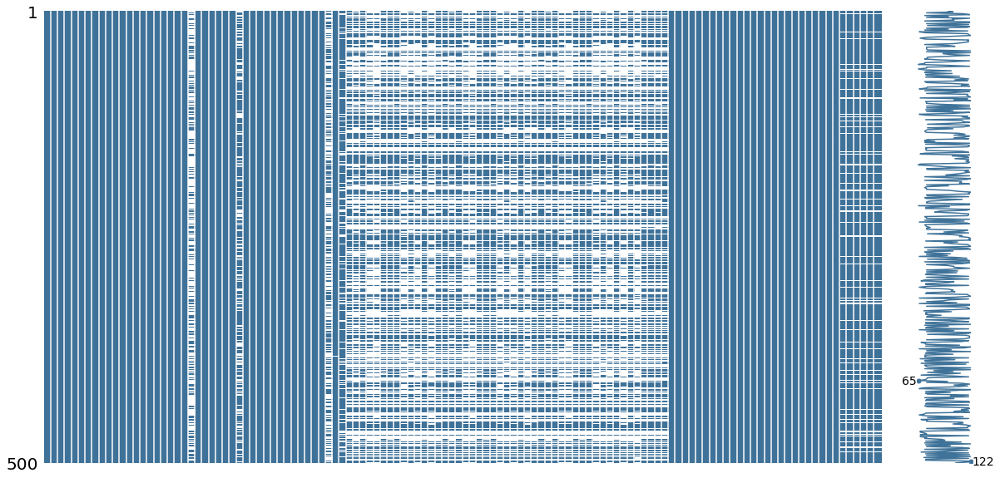

In [341]:
train = pd.read_csv('../input/application_train.csv')
msno.matrix(train.sample(500), inline=True, sparkline=True, 
            figsize=(20,10), sort=None, color=(0.25, 0.45, 0.6))

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/missingno/missingno.py:198: UserWarning:

The 'inline' argument has been deprecated, and will be removed in a future version of missingno.



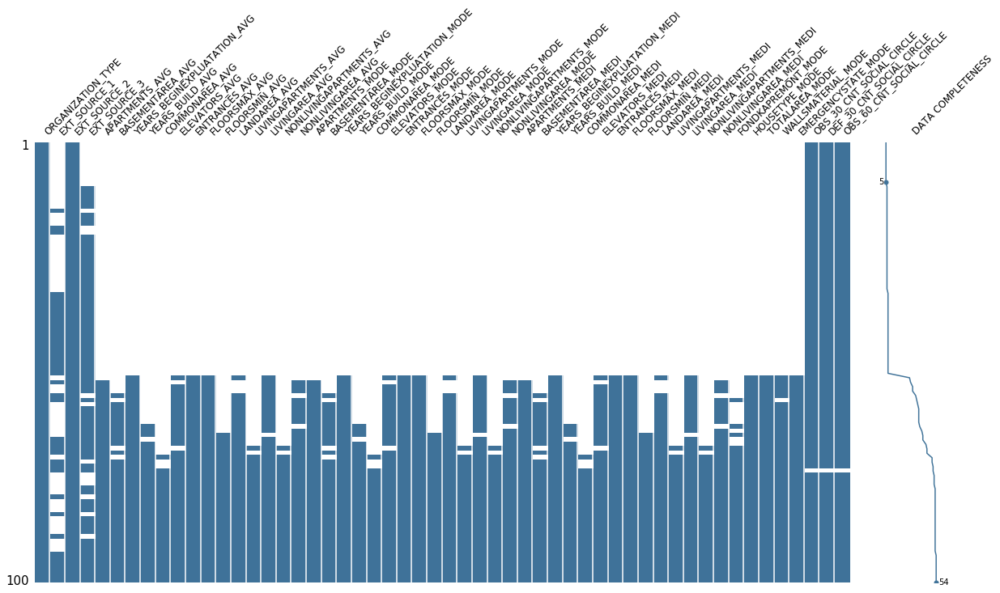

In [342]:
#100サンプルと、40~94番目の変数を取り出してみる
#比率がわかりやすいようにデータを並び替える
msno.matrix(train.iloc[0:100, 40:94], inline=True, 
            sparkline=True, figsize=(20,10), sort='ascending', 
            fontsize=12, labels=True, color=(0.25, 0.45, 0.6))

/Users/fushiharatakuya/.pyenv/versions/anaconda3-2020.02/lib/python3.7/site-packages/missingno/missingno.py:460: UserWarning:

The 'inline' argument has been deprecated, and will be removed in a future version of missingno.



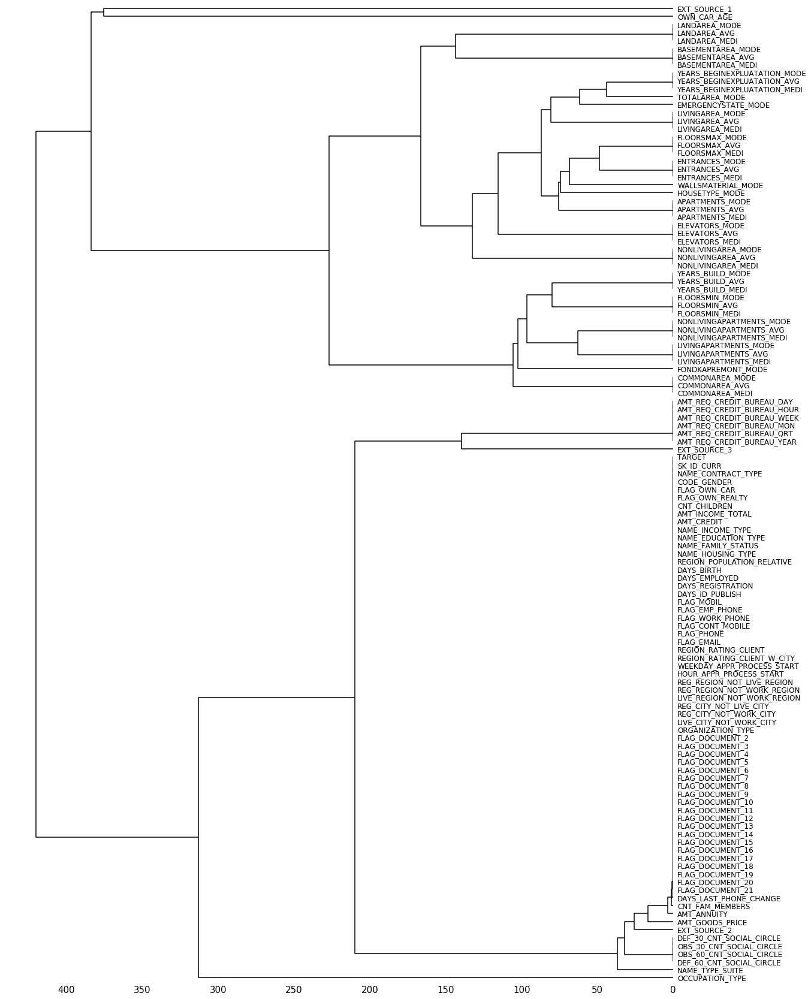

In [343]:
#欠損値がある列のみでデンドログラムを作成し、関係性を調べる

msno.dendrogram(train, inline=True, fontsize=12, figsize=(20,30))

In [344]:
train['incomplete'] = 1
train.loc[train.isnull().sum(axis=1) < 35, 'incomplete'] = 0

# incomplete==0のTARGETの数の平均
mean_c = np.mean(train.loc[train['incomplete'] == 0, 'TARGET'].values)
#incimplete==1のTARGETの数の平均
mean_i = np.mean(train.loc[train['incomplete'] == 1, 'TARGET'].values)
print('default ratio for more complete: {:.1%} \ndefault ratio for less complete: {:.1%}'.format(mean_c, mean_i))

default ratio for more complete: 6.9% 
default ratio for less complete: 9.2%


In [346]:
train.isnull().sum(axis=1)

0          1
1          2
2         48
3         56
4         50
          ..
307506     8
307507    10
307508     4
307509    30
307510    17
Length: 307511, dtype: int64

In [348]:
train.loc[train['incomplete']==0, 'TARGET']

0         1
1         0
12        0
13        0
14        0
         ..
307506    0
307507    0
307508    0
307509    1
307510    0
Name: TARGET, Length: 152641, dtype: int64

In [349]:
from scipy.stats import chi2_contingency

props = pd.crosstab(train.incomplete, train.TARGET)
c = chi2_contingency(props, lambda_="log-likelihood")
print(props, "\n p-value= ", c[1])

TARGET           0      1
incomplete               
0           142035  10606
1           140651  14219 
 p-value=  1.141230219527906e-114


# 以下、関数記述

In [44]:
zentai = application_train['NAME_TYPE_SUITE'].value_counts()

In [57]:
def object_label(var_name,tar_name, data):
    #変数の中のカテゴリーごとにTargetの0,1の割合を集計
    #tar_nameは0,1ラベルの変数
    #この変数は1の割合を示している
    zentai = data[var_name].value_counts()
    target_1 = data[data[tar_name]==1][var_name].value_counts()
    per = target_1/zentai
    per = per.sort_values(ascending=False)
    
    #プロットを行う
    labels = list(per.index)
    x = np.arange(len(labels))
    width = 0.35
    fig, ax = plt.subplots()
    rect = ax.bar(x, per, width)
    ax.set_xticks(x)
    ax.set_xticklabels(labels,rotation=-90)
    plt.show()
    per = pd.DataFrame(per)
    return per

In [135]:
# Plots the disribution of a variable colored by value of the target
def kde_target(var_name, df):
    
    # Calculate the correlation coefficient between the new variable and the target
    corr = df['TARGET'].corr(df[var_name])
    
    # Calculate medians for repaid vs not repaid
    avg_repaid = df.loc[df['TARGET'] == 0, var_name].median()
    avg_not_repaid = df.loc[df['TARGET'] == 1, var_name].median()
    
    plt.figure(figsize = (9, 6))
    
    # Plot the distribution for target == 0 and target == 1
    sns.kdeplot(df.loc[df['TARGET'] == 0, var_name], label = 'TARGET == 0')
    sns.kdeplot(df.loc[df['TARGET'] == 1, var_name], label = 'TARGET == 1')
    
    # label the plot
    plt.xlabel(var_name); plt.ylabel('Density'); plt.title('%s Distribution' % var_name)
    plt.legend();
    
    # print out the correlation
    print('The correlation between %s and the TARGET is %0.4f' % (var_name, corr))
    # Print out average values
    print('Median value for loan that was not repaid = %0.4f' % avg_not_repaid)
    print('Median value for loan that was repaid =     %0.4f' % avg_repaid)

In [317]:
# Plots the disribution of a variable colored by value of the target
def log_kde_target(var_name, df):
    
    # Calculate the correlation coefficient between the new variable and the target
    corr = df['TARGET'].corr(df[var_name])
    
    # Calculate medians for repaid vs not repaid
    avg_repaid = df.loc[df['TARGET'] == 0, var_name].median()
    avg_not_repaid = df.loc[df['TARGET'] == 1, var_name].median()
    
    plt.figure(figsize = (9, 6))
    
    # Plot the distribution for target == 0 and target == 1
    sns.kdeplot(np.log(df.loc[df['TARGET'] == 0, var_name]), label = 'TARGET == 0')
    sns.kdeplot(np.log(df.loc[df['TARGET'] == 1, var_name]), label = 'TARGET == 1')
    
    # label the plot
    plt.xlabel(var_name); plt.ylabel('Density'); plt.title('%s Distribution' % var_name)
    plt.legend();
    
    # print out the correlation
    print('The correlation between %s and the TARGET is %0.4f' % (var_name, corr))
    # Print out average values
    print('Median value for loan that was not repaid = %0.4f' % avg_not_repaid)
    print('Median value for loan that was repaid =     %0.4f' % avg_repaid)

一度、このcsvだけでモデルを作って、性能を見てみるか？
それとも、もう一つくらいcsvを見て、合わせて学習すべきか

今回、モデルに当てはまる前にどんな変数が効きそうかを絞り出すことに注力したが、非効率的だったかも？
最初のデータをみる段階は、「こんな変数があるんだ」くらいにとどめておいて、どれが効くかどうかはモデルにぶち込んで考えた方が効率的。